一、数据预处理主要代码

1.一热编码

In [38]:
import pandas as pd

# 读取 CSV 文件
file_path = 'E:/赋值.csv'  # 替换为你的文件路径
data = pd.read_csv(file_path)

# 对指定的名义变量进行独热编码
categorical_columns = ['Job_Title', 'Industry', 'Location', 'Required_Skills']
data_encoded = pd.get_dummies(data, columns=categorical_columns)

# 查看处理后的数据
print(data_encoded.head())

# 如果需要保存处理后的数据到新的 CSV 文件
data_encoded.to_csv('E:/赋值_encoded.csv', index=False)

   Company_Size  AI_Adoption_Level  Automation_Risk     Salary_USD  \
0             1                  2                3  111392.165243   
1             3                  2                3   93792.562466   
2             3                  2                3  107170.263069   
3             1                  1                3   93027.953758   
4             1                  1                1   87752.922171   

   Remote_Friendly  Job_1_Projection  Job_Title_AI Researcher  \
0                1                 1                    False   
1                0                -1                    False   
2                1                 1                     True   
3                0                 1                    False   
4                1                -1                    False   

   Job_Title_Cybersecurity Analyst  Job_Title_Data Scientist  \
0                             True                     False   
1                            False                     False

2.标准化数据

In [66]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# 加载数据
data = pd.read_csv('E:/赋值_encoded1.csv')

# 选择数量数据的列
columns_to_normalize = data.columns

# 创建StandardScaler对象
scaler = StandardScaler()

# 应用Z标准化
data[columns_to_normalize] = scaler.fit_transform(data[columns_to_normalize])

# 保存标准化后的数据
data.to_csv('E:/normalized_data.csv', index=False)

二、自动化风险和工作岗位的弦图：所用数据文件：\ai_job_market_insights.csv原始文件，对这两列'Job_Title', 'Automation_Risk'做频数计数操作，绘制弦图。注意需要先将宽数据转长格式

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
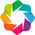

:Chord   [Job_Title,Automation_Risk]   (Count)

In [67]:
#弦图
import pandas as pd
import holoviews as hv
from holoviews import opts

# 启用 Bokeh 后端
hv.extension('bokeh')

# 读取数据（替换为你的实际文件路径）
df = pd.read_csv(r"E:\ai_job_market_insights.csv")

# 1. 生成 Job_Title 和 Automation_Risk 的交叉表
cross_tab = pd.crosstab(df['Job_Title'], df['Automation_Risk'])

# 2. 将交叉表转换为长格式（Holoviews 需要此格式）
edges = cross_tab.stack().reset_index()
edges.columns = ['Job_Title', 'Automation_Risk', 'Count']

# 3. 生成弦图（确保数据格式正确）
chord = hv.Chord(edges, ['Job_Title', 'Automation_Risk'], ['Count'])

# 4. 设置样式，调整弦的颜色
chord.opts(
    opts.Chord(
        cmap='Category20',          # Node color map
        edge_cmap='Viridis',        # Change the edge (chord) color map
        edge_color=hv.dim('Count'), # Map the color of the edges to the 'Count' column
        labels='index',
        node_color='index',
        width=800,
        height=800,
        directed=False
    )
)

三、公司规模与薪酬关联分析图（柱状图和核密度图）

      Salary_USD Company_Size
0  111392.165243        Small
1   93792.562466        Large
2  107170.263069        Large
3   93027.953758        Small
4   87752.922171        Small


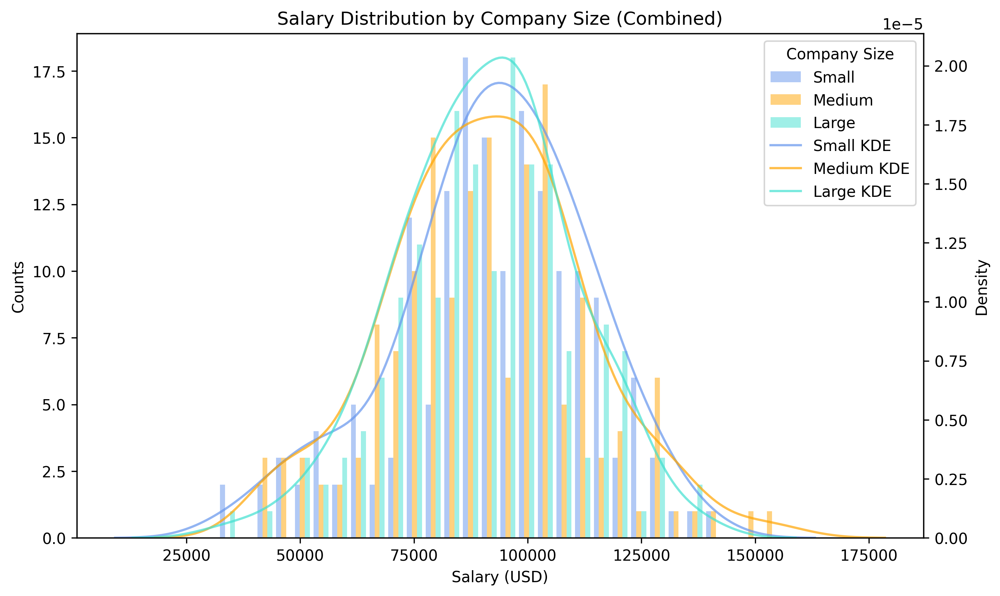

图片已保存到: E:\salary_distribution_combined.png


In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 设置文件路径
file_path = r'E:\薪资和公司规模数据.csv'
save_path = r'E:\salary_distribution_combined.png'

# 读取CSV文件
data = pd.read_csv(file_path)

# 检查数据结构
print(data.head())

# 按公司规模分组
small_company = data[data['Company_Size'] == 'Small']['Salary_USD']
medium_company = data[data['Company_Size'] == 'Medium']['Salary_USD']
large_company = data[data['Company_Size'] == 'Large']['Salary_USD']

# 创建图表
fig, ax1 = plt.subplots(figsize=(10, 6))

# 绘制柱状图
ax1.hist([small_company, medium_company, large_company], 
         bins=30, 
         label=['Small', 'Medium', 'Large'],
         color=['#6495ED', '#FFA500', '#40E0D0'],
         alpha=0.5)

# 设置柱状图的标签和标题
ax1.set_xlabel('Salary (USD)')
ax1.set_ylabel('Counts', color='black')
ax1.tick_params(axis='y', labelcolor='black')

# 创建第二个坐标轴用于KDE曲线
ax2 = ax1.twinx()

# 绘制核密度估计曲线
sns.kdeplot(small_company, color='#6495ED', label='Small KDE', alpha=0.7, ax=ax2)
sns.kdeplot(medium_company, color='#FFA500', label='Medium KDE', alpha=0.7, ax=ax2)
sns.kdeplot(large_company, color='#40E0D0', label='Large KDE', alpha=0.7, ax=ax2)

# 设置KDE曲线的标签
ax2.set_ylabel('Density', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# 合并图例
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, title='Company Size', loc='upper right')

# 添加标题
plt.title('Salary Distribution by Company Size (Combined)')
plt.show()

# 保存图片
plt.savefig(save_path)
plt.close()

print(f'图片已保存到: {save_path}')

四、城市-职位-规模桑基图

In [69]:
import pandas as pd
from pyecharts import options as opts
from pyecharts.charts import Sankey

# 加载数据（请替换为实际文件路径）
data_path = 'E:/职位、规模、城市.csv'
df = pd.read_csv(data_path)

# 定义节点列表
nodes = []
for job in df['Job_Title'].unique():
    nodes.append({"name": job})
for size in df['Company_Size'].unique():
    nodes.append({"name": size})
for loc in df['Location'].unique():
    nodes.append({"name": loc})

# 统计流量数据
links = []
for _, row in df.iterrows():
    job = row['Job_Title']
    size = row['Company_Size']
    loc = row['Location']
    link1 = {"source": nodes.index({"name": job}), "target": nodes.index({"name": size}), "value": 1}
    if link1 not in links:
        links.append(link1)
    else:
        links[links.index(link1)]["value"] += 1

    link2 = {"source": nodes.index({"name": size}), "target": nodes.index({"name": loc}), "value": 1}
    if link2 not in links:
        links.append(link2)
    else:
        links[links.index(link2)]["value"] += 1

# 创建桑基图，调整布局
sankey = (
    Sankey(init_opts=opts.InitOpts(width="1600px", height="800px"))  # 设置图表的宽度和高度
    .add(
        series_name="",
        nodes=nodes,
        links=links,
        linestyle_opt=opts.LineStyleOpts(opacity=0.8, curve=0.5, color="source"),
        label_opts=opts.LabelOpts(position="right"),
    )
    .set_global_opts(
        title_opts=opts.TitleOpts(title="职位、规模和城市关系桑基图"),
        toolbox_opts=opts.ToolboxOpts(is_show=True),
    )
)

# 渲染图表到 HTML 文件
sankey.render("E:/sankey_diagram_adjusted.html")

'E:\\sankey_diagram_adjusted.html'

五、城市-岗位-规模马赛克图
（以**赋值处理**后的数据为基础，针对同一城市、同一职位的所有公司规模数据，计算其**平均值**，将所得结果作为该城市该职位的公司规模代表
值。）

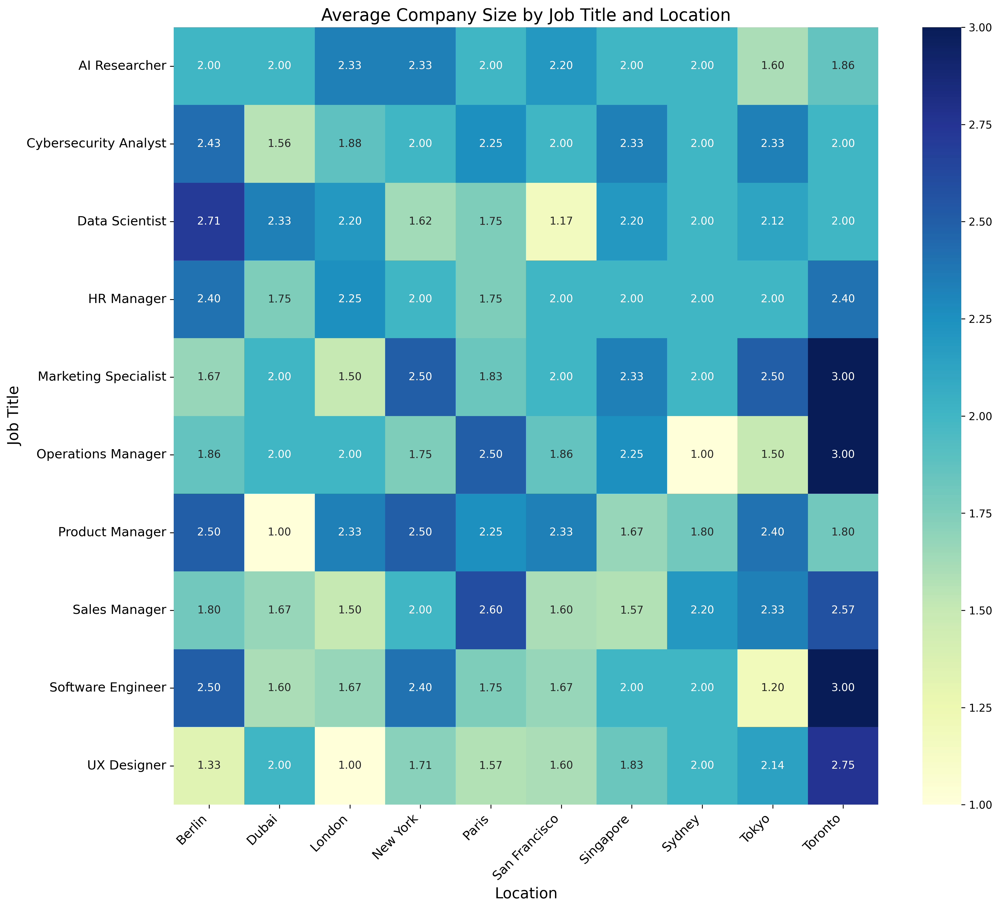

In [70]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 读取数据
file_path = r"E:\城市岗位规模马赛克数.csv"
data = pd.read_csv(file_path)

# 计算每个岗位和地点组合的公司规模平均数
pivot_table = data.pivot_table(index='Job_Title', columns='Location', values='Company_Size', aggfunc='mean')

# 设置图片清晰度
plt.rcParams['figure.dpi'] = 300

# 绘制热力图（调整图形尺寸）
plt.figure(figsize=(14, 12))  # 增大画布尺寸
sns.heatmap(
    pivot_table, 
    annot=True, 
    fmt=".2f", 
    cmap="YlGnBu",
    annot_kws={"fontsize": 10}  # 注释字体大小
)

# 添加标题和标签（设置字体大小）
plt.title('Average Company Size by Job Title and Location', fontsize=16)
plt.xlabel('Location', fontsize=14)
plt.ylabel('Job Title', fontsize=14)

# 优化坐标标签显示
plt.xticks(
    rotation=45, 
    ha='right',  # 右对齐防止重叠
    fontsize=12
)
plt.yticks(fontsize=12)

plt.tight_layout()  # 自动调整布局，避免元素重叠

# 保存图片到 E 盘根目录（优化保存参数）
save_path = r"E:\city_job_size_heatmap.png"
plt.savefig(save_path, bbox_inches='tight')  # 裁剪空白边缘

# 显示图形
plt.show()

六、城市、职位与公司规模的折线图
七、3类代表城市的不同职位公司规模面积堆叠图
（这是由马赛克图和折线图分析得出的3个不同规模的代表城市，绘制其不同职位的公司规模面积堆叠图，更加清晰地显示这三类城市的不同职位的公司规模特征）

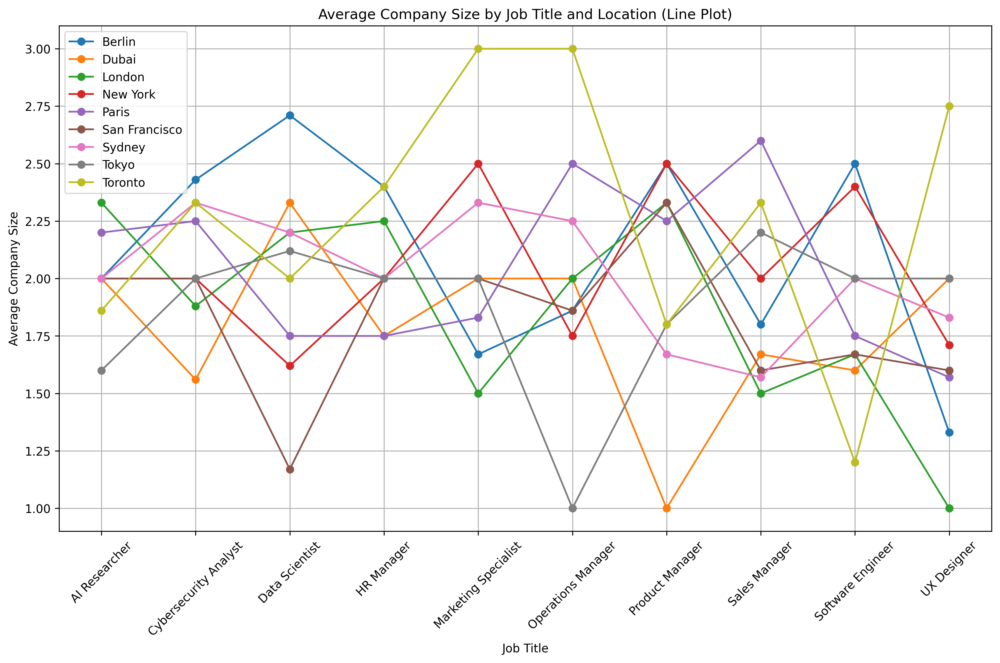

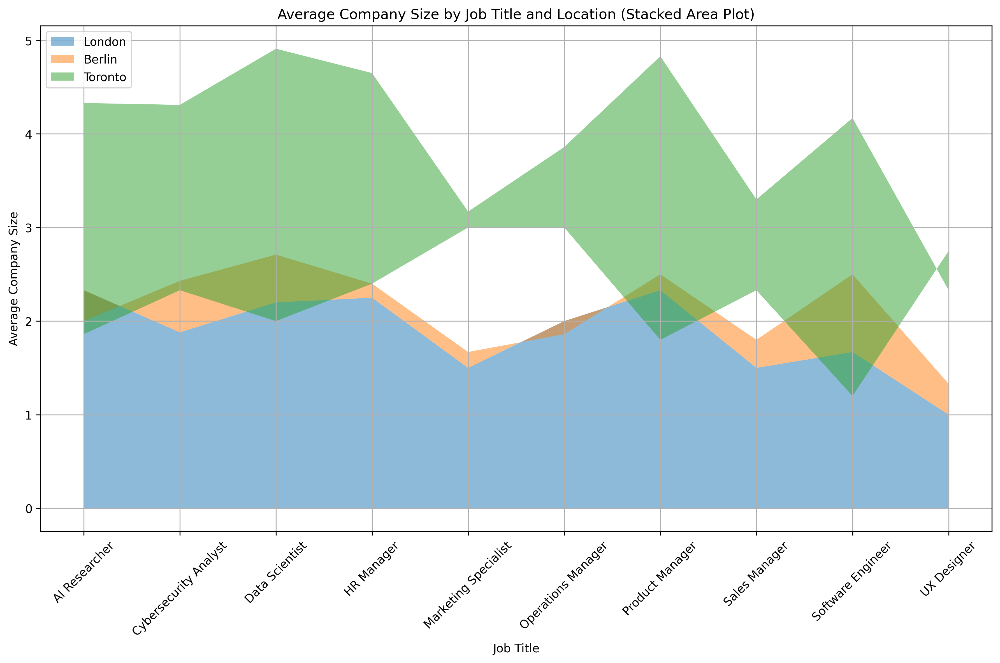

In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 数据
data = {
    'Job Title': ['AI Researcher', 'Cybersecurity Analyst', 'Data Scientist', 'HR Manager', 'Marketing Specialist', 'Operations Manager', 'Product Manager', 'Sales Manager', 'Software Engineer', 'UX Designer'],
    'Berlin': [2.00, 2.43, 2.71, 2.40, 1.67, 1.86, 2.50, 1.80, 2.50, 1.33],
    'Dubai': [2.00, 1.56, 2.33, 1.75, 2.00, 2.00, 1.00, 1.67, 1.60, 2.00],
    'London': [2.33, 1.88, 2.20, 2.25, 1.50, 2.00, 2.33, 1.50, 1.67, 1.00],
    'New York': [2.00, 2.00, 1.62, 2.00, 2.50, 1.75, 2.50, 2.00, 2.40, 1.71],
    'Paris': [2.20, 2.25, 1.75, 1.75, 1.83, 2.50, 2.25, 2.60, 1.75, 1.57],
    'San Francisco': [2.00, 2.00, 1.17, 2.00, 2.00, 1.86, 2.33, 1.60, 1.67, 1.60],
    'Sydney': [2.00, 2.33, 2.20, 2.00, 2.33, 2.25, 1.67, 1.57, 2.00, 1.83],
    'Tokyo': [1.60, 2.00, 2.12, 2.00, 2.00, 1.00, 1.80, 2.20, 2.00, 2.00],
    'Toronto': [1.86, 2.33, 2.00, 2.40, 3.00, 3.00, 1.80, 2.33, 1.20, 2.75]
}

df = pd.DataFrame(data)

# 折线图
plt.figure(figsize=(12, 8))
for city in df.columns[1:]:
    plt.plot(df['Job Title'], df[city], marker='o', label=city)

plt.title('Average Company Size by Job Title and Location (Line Plot)')
plt.xlabel('Job Title')
plt.ylabel('Average Company Size')
plt.xticks(rotation=45)  # 设置横轴标签的倾斜角度为45度
plt.legend()
plt.grid(True)
plt.tight_layout()  # 自动调整子图参数，使之填充整个图像区域
plt.savefig('E:/line_plot.png')  # 保存折线图
plt.show()

# 面积堆叠图
cities = ['London', 'Berlin', 'Toronto']
plt.figure(figsize=(12, 8))

# 计算累计公司规模
bottom = np.zeros(len(df['Job Title']))
for city in cities:
    plt.fill_between(df['Job Title'], df[city], bottom, label=city, alpha=0.5)
    bottom += df[city]

plt.title('Average Company Size by Job Title and Location (Stacked Area Plot)')
plt.xlabel('Job Title')
plt.ylabel('Average Company Size')
plt.xticks(rotation=45)  # 设置横轴标签的倾斜角度为45度
plt.legend(loc='upper left')
plt.grid(True)
plt.tight_layout()  # 自动调整子图参数，使之填充整个图像区域
plt.savefig('E:/stacked_area_plot.png')  # 保存面积堆叠图
plt.show()

八、行业-职位-技能复杂网络分析

发现 4 个社区
度中心性Top 10: [('Entertainment', 0.6896551724137931), ('Technology', 0.6896551724137931), ('Retail', 0.6896551724137931), ('Education', 0.6896551724137931), ('Finance', 0.6896551724137931), ('Transportation', 0.6896551724137931), ('Telecommunications', 0.6896551724137931), ('Manufacturing', 0.6896551724137931), ('Healthcare', 0.6896551724137931), ('Energy', 0.6896551724137931)]
介数中心性Top 10: [('Transportation', 0.14168035030103993), ('Marketing', 0.134475916803503), ('Communication', 0.13392172961138477), ('Operations Manager', 0.059852216748768484), ('Product Manager', 0.05625342090859333), ('Retail', 0.05229885057471264), ('Marketing Specialist', 0.048111658456486045), ('Healthcare', 0.041666666666666664), ('Software Engineer', 0.0401272577996716), ('Finance', 0.03967569786535302)]


d:\COMMON\Python\Lib\site-packages\networkx\drawing\nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


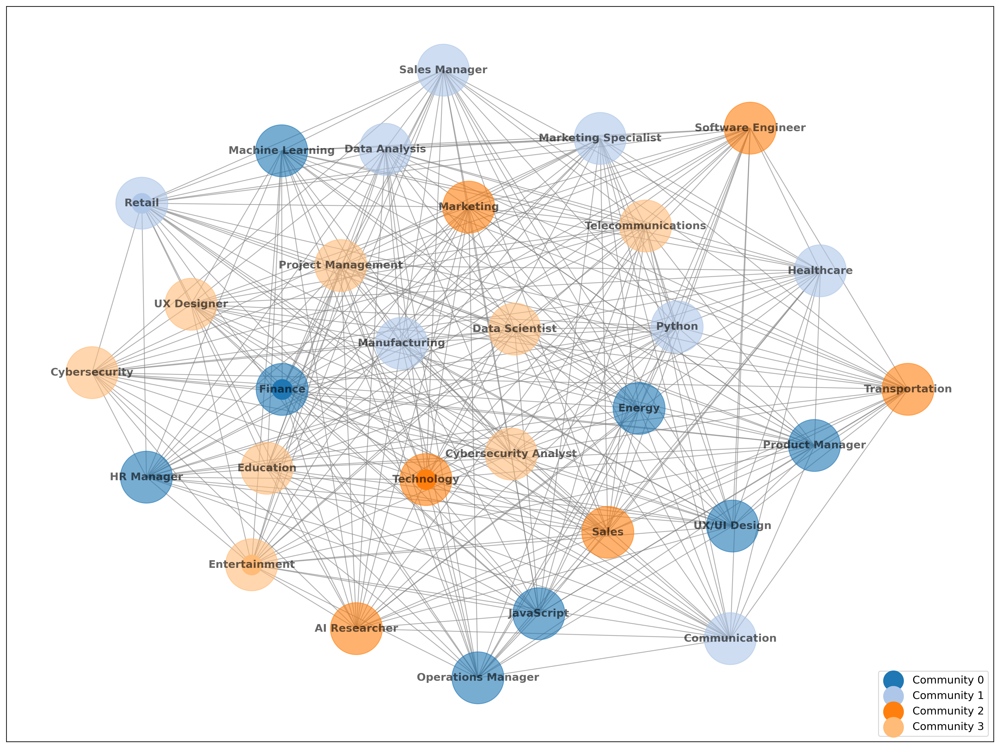

网络分析结果已保存到E盘根目录


<Figure size 1920x1440 with 0 Axes>

In [72]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from community import community_louvain  # 需安装python-louvain

# 读取数据
df = pd.read_csv('E:/ai_job_market_insights.csv')

# 清洗技能字段（假设技能以逗号分隔）
df['Required_Skills'] = df['Required_Skills'].str.split(',')

# 提取唯一节点,避免节点重复
industries = df['Industry'].unique()
job_titles = df['Job_Title'].unique()
skills = list(set(skill for sublist in df['Required_Skills'] for skill in sublist))

# 创建空图
G = nx.Graph()

# 添加节点
G.add_nodes_from(industries, node_type='industry')
G.add_nodes_from(job_titles, node_type='job')
G.add_nodes_from(skills, node_type='skill')

# 定义边权重计算函数：基于指定分组的权重（频率）
def calculate_weight(df, group_col, target_col):
    return df.groupby([group_col, target_col]).size().reset_index(name='weight')

# 添加行业-职位边
industry_job_edges = calculate_weight(df, 'Industry', 'Job_Title')
for _, row in industry_job_edges.iterrows():
    G.add_edge(row['Industry'], row['Job_Title'], weight=row['weight'], edge_type='industry_job')

# 添加职位-技能边
job_skill_edges = df.explode('Required_Skills').groupby(['Job_Title', 'Required_Skills']).size().reset_index(name='weight')
for _, row in job_skill_edges.iterrows():
    G.add_edge(row['Job_Title'], row['Required_Skills'], weight=row['weight'], edge_type='job_skill')

# 添加行业-技能边（间接关联）
industry_skill_edges = df.explode('Required_Skills').groupby(['Industry', 'Required_Skills']).size().reset_index(name='weight')
for _, row in industry_skill_edges.iterrows():
    G.add_edge(row['Industry'], row['Required_Skills'], weight=row['weight'], edge_type='industry_skill')

# 转换为无向图（Louvain要求无向图）
undirected_G = G.to_undirected()

# 运行Louvain算法
partition = community_louvain.best_partition(undirected_G)

# 将社区标签添加到节点属性
nx.set_node_attributes(G, partition, 'community')

# 打印社区结果
communities = {}
for node, comm_id in partition.items():
    communities.setdefault(comm_id, []).append(node)
print(f"发现 {len(communities)} 个社区")

# 度中心性
degree_centrality = nx.degree_centrality(G)

# 介数中心性
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

# 接近中心性
closeness_centrality = nx.closeness_centrality(G)

# 聚类系数
clustering_coefficient = nx.clustering(G)

# 提取Top 10关键节点
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("度中心性Top 10:", top_degree)
print("介数中心性Top 10:", top_betweenness)

# 定义节点颜色（按社区）
community_colors = [plt.cm.tab20(i) for i in range(len(communities))]
colors = [community_colors[partition[node]] for node in G.nodes()]

# 定义节点大小（按度中心性）
sizes = [degree_centrality[node] * 5000 for node in G.nodes()]

# 绘制网络
plt.figure(figsize=(20, 15))
pos = nx.spring_layout(G, k=0.15, iterations=50)  # 调整k值避免重叠
nx.draw_networkx(
    G,
    pos,
    node_color=colors,
    node_size=sizes,
    cmap=plt.cm.tab20,
    with_labels=True,
    font_size=12,  # 增大字体大小
    font_color='black',  # 设置字体颜色为黑色
    font_weight='bold',  # 设置字体加粗
    edge_color='gray',
    alpha=0.6
)

# 添加图例
legend_nodes = [nx.draw_networkx_nodes(G, pos, nodelist=[communities[i][0]], node_color=[community_colors[i]], node_size=500) for i in range(len(communities))]
plt.legend(legend_nodes, [f"Community {i}" for i in range(len(communities))], loc='lower right', fontsize=12)  # 增大图例字体大小

#plt.title("行业-职位-技能复杂网络分析", fontsize=16)  # 增大标题字体大小
plt.show()
plt.savefig('E:/行业-职位-技能复杂网络分析.png') 

# 保存网络指标
centrality_data = {
    'Node': list(G.nodes()),
    'Community': [partition[node] for node in G.nodes()],
    'Degree Centrality': [degree_centrality[node] for node in G.nodes()],
    'Betweenness Centrality': [betweenness_centrality[node] for node in G.nodes()],
    'Closeness Centrality': [closeness_centrality[node] for node in G.nodes()],
    'Clustering Coefficient': [clustering_coefficient[node] for node in G.nodes()]
}

centrality_df = pd.DataFrame(centrality_data)
centrality_df.to_csv('E:/network_analysis_results.csv', index=False)

print("网络分析结果已保存到E盘根目录")

#读取数据：从CSV文件中读取数据。
#清洗技能字段：将技能字段中的字符串分割成列表。
#提取唯一节点：提取行业中的唯一节点、职位和技能。
#创建空图：创建一个空的无向图 G。
#添加节点：将行业中的唯一节点、职位和技能添加到图中。
#定义边权重计算函数：定义一个函数来计算边的权重。
#添加边：根据数据添加行业-职位边、职位-技能边和行业-技能边。
#转换为无向图：将图转换为无向图，以满足Louvain算法的要求。
#运行Louvain算法：运行Louvain算法来确定社区结构。
#将社区标签添加到节点属性：将检测到的社区标签添加到每个节点的属性中。
#计算网络指标：计算度中心性、介数中心性、接近中心性和聚类系数。
#提取Top 10关键节点：提取度中心性和介数中心性最高的前10个节点。
#定义节点颜色和大小：根据社区和度中心性定义节点颜色和大小。
#绘制网络：绘制网络图并保存为PNG文件。
#保存网络指标：将网络指标保存到CSV文件中。

九、K-means聚类分析
（1.计算岗位技能频数，得到岗位技能频数矩阵.csv
 2.聚类，K=2
 3.聚类结果降到3维可视化）

1.计算岗位技能频数，得到岗位技能频数矩阵.csv

In [73]:
import pandas as pd

# 读取CSV文件
file_path = 'E:\\岗位和技能数据.csv'
df = pd.read_csv(file_path)

# 确保Required_Skills列是字符串类型
df['Required_Skills'] = df['Required_Skills'].astype(str)

# 分割技能列（如果技能是用逗号分隔的）
df['Required_Skills'] = df['Required_Skills'].str.split(',')

# 将数据展开以便计算频数
df_exploded = df.explode('Required_Skills')

# 计算每个岗位下各个技能的频数
skill_frequency = df_exploded.groupby(['Job_Title', 'Required_Skills']).size().unstack(fill_value=0)

# 确保结果是一个10x10的矩阵
# 如果某些岗位或技能缺失，它们的频数将被填充为0
skill_frequency_matrix = skill_frequency.reindex(index=df['Job_Title'].unique(), columns=df_exploded['Required_Skills'].unique(), fill_value=0)

# 将结果保存到新的CSV文件
output_file_path = 'E:\\岗位技能频数矩阵.csv'
skill_frequency_matrix.to_csv(output_file_path)

print(f"技能频数矩阵计算完成，结果已保存到 {output_file_path}")

技能频数矩阵计算完成，结果已保存到 E:\岗位技能频数矩阵.csv


 2.聚类，K=2
 3.聚类结果降到3维可视化

聚类结果已保存到 E:\岗位技能聚类结果.csv
聚类三维图表已保存到 E:\岗位技能聚类三维图.png


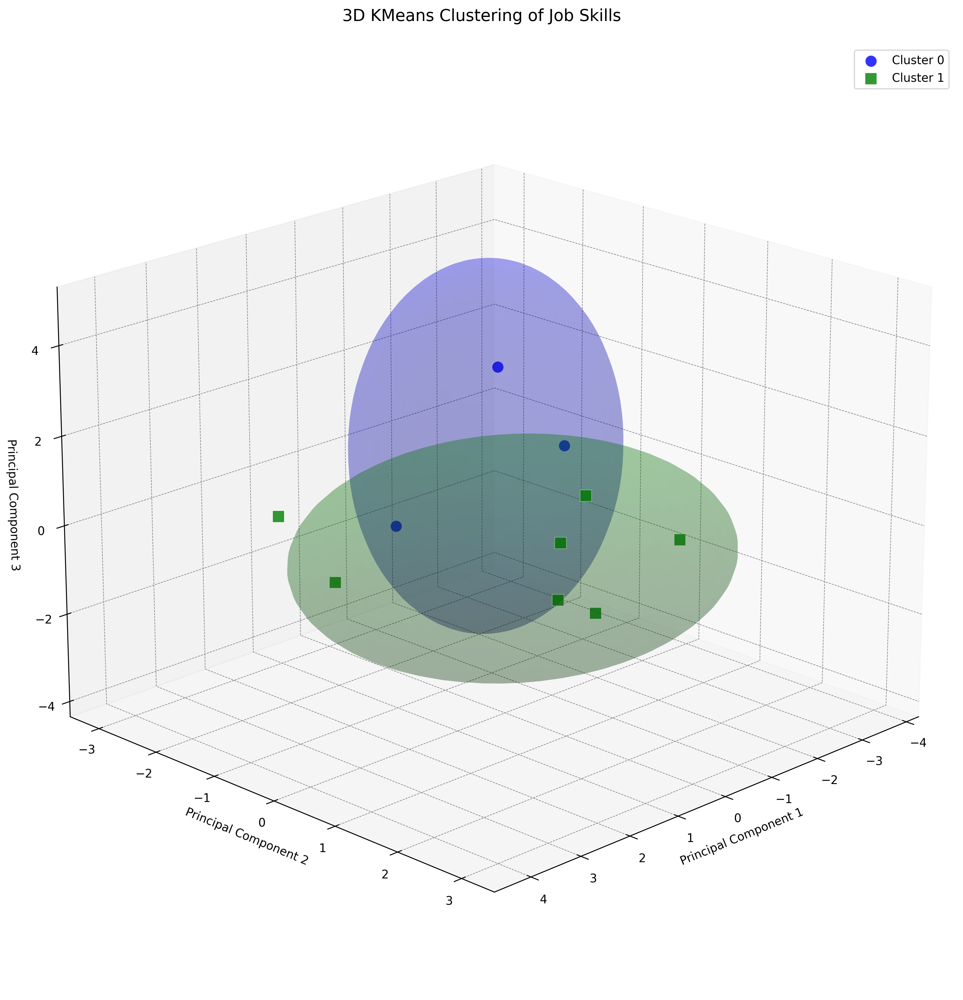

In [74]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import multivariate_normal


def create_ellipsoid(mean, cov, n_std=2):
    # 创建椭球体
    u = np.linspace(0, 2 * np.pi, 50)
    v = np.linspace(0, np.pi, 50)
    x = mean[0] + n_std * np.outer(np.cos(u), np.sin(v)) * np.sqrt(cov[0, 0])
    y = mean[1] + n_std * np.outer(np.sin(u), np.sin(v)) * np.sqrt(cov[1, 1])
    z = mean[2] + n_std * np.outer(np.ones_like(u), np.cos(v)) * np.sqrt(cov[2, 2])
    return x, y, z

# 读取岗位技能频数矩阵
file_path = 'E:\\岗位技能频数矩阵.csv'
df = pd.read_csv(file_path, index_col=0)  # 第一列作为行索引

# 数据标准化
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

# 使用PCA降维到3维
pca = PCA(n_components=3)
pca_data = pca.fit_transform(scaled_data)

# KMeans聚类
n_clusters = 2  # 假设分为2类，您可以根据需要调整
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

# 将聚类结果添加到原始数据框
df['Cluster'] = clusters

# 可视化聚类结果（三维图）
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(111, projection='3d')

# 定义颜色和标记
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
markers = ['o', 's', 'D', '^', 'v', '<', '>']

# 绘制每个聚类的点
for i in range(n_clusters):
    cluster_data = pca_data[clusters == i]
    ax.scatter(
        cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2],
        c=colors[i % len(colors)], marker=markers[i % len(markers)],
        label=f'Cluster {i}', s=100, alpha=0.8, edgecolors='w', linewidths=0.5
    )

    # 计算聚类的质心和协方差矩阵
    mean = np.mean(cluster_data, axis=0)
    cov = np.cov(cluster_data, rowvar=False)
    
    # 创建椭球体
    try:
        x, y, z = create_ellipsoid(mean, cov)
        ax.plot_surface(x, y, z, color=colors[i % len(colors)], alpha=0.2)
    except np.linalg.LinAlgError:
        print(f"Cluster {i} has a singular covariance matrix. Skipping surface plot for this cluster.")

# 设置轴标签和标题
ax.set_xlabel('Principal Component 1', fontsize=10, fontfamily='sans-serif')
ax.set_ylabel('Principal Component 2', fontsize=10, fontfamily='sans-serif')
ax.set_zlabel('Principal Component 3', fontsize=10, fontfamily='sans-serif')
ax.set_title('3D KMeans Clustering of Job Skills', fontsize=14, fontfamily='sans-serif', pad=20)

# 添加图例
ax.legend(loc='upper right', fontsize=10)

# 调整网格线
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.xaxis._axinfo['grid'].update(color='gray', linestyle='--', linewidth=0.5)
ax.yaxis._axinfo['grid'].update(color='gray', linestyle='--', linewidth=0.5)
ax.zaxis._axinfo['grid'].update(color='gray', linestyle='--', linewidth=0.5)

# 调整视角
ax.view_init(elev=20, azim=45)

# 设置背景颜色为白色
ax.set_facecolor('white')

# 调整布局以确保标签显示完整
plt.tight_layout()

# 保存图表
chart_path = 'E:\\岗位技能聚类三维图.png'
plt.savefig(chart_path, dpi=300, bbox_inches='tight')

# 保存聚类结果到CSV文件
result_path = 'E:\\岗位技能聚类结果.csv'
df.to_csv(result_path)

print(f"聚类结果已保存到 {result_path}")
print(f"聚类三维图表已保存到 {chart_path}")


十、绘制技能需求玫瑰图
（根据聚类分析，excel计算两类岗位的技能组合百分比后，py绘制玫瑰图可视化）

1.cluster 0 的技能需求玫瑰图

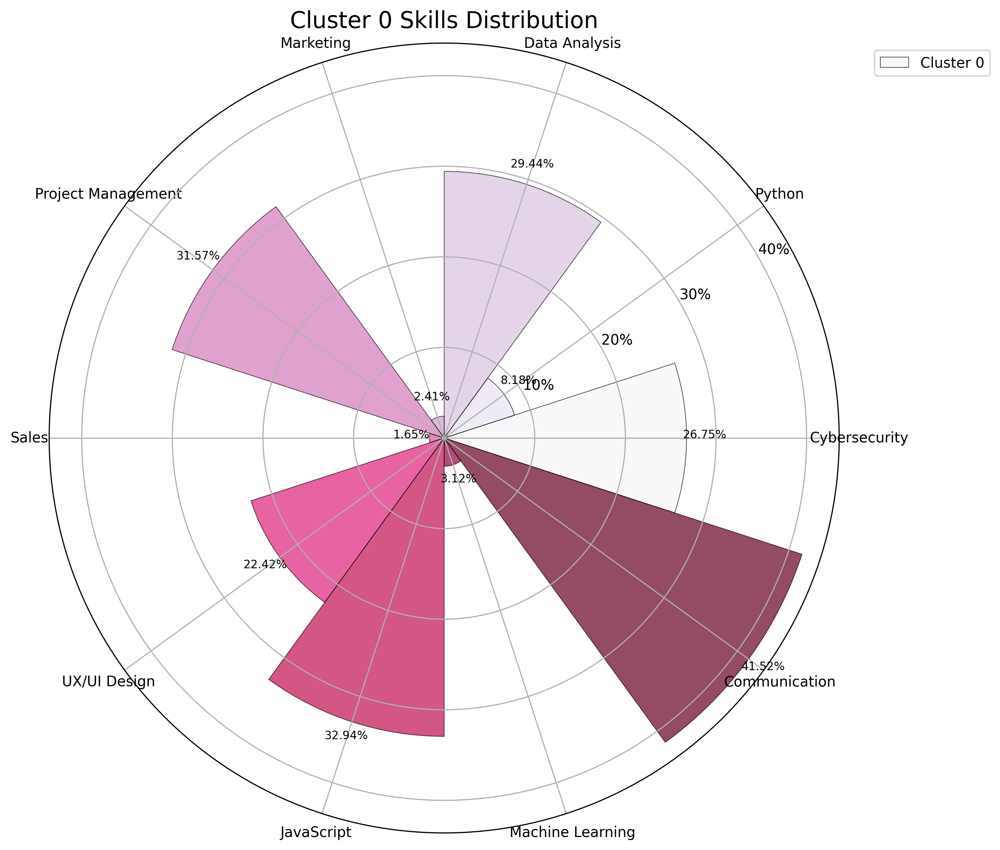

In [75]:
import numpy as np
import matplotlib.pyplot as plt

# 数据准备
skills = [
    "Cybersecurity", "Python", "Data Analysis", "Marketing", "Project Management", "Sales",
    "UX/UI Design", "JavaScript", "Machine Learning", "Communication"
]
values = [26.75, 8.18, 29.44, 2.41, 31.57, 1.65, 22.42, 32.94, 3.12, 41.52]

# 计算角度
angles = np.linspace(0, 2 * np.pi, len(skills), endpoint=False)

# 创建玫瑰图
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# 使用不同的颜色映射
colors = plt.cm.PuRd(np.linspace(0, 1, len(skills)))

# 绘制每个技能的扇形
for i in range(len(skills)):
    # 计算每个扇形的起始和结束角度
    start_angle = angles[i]
    end_angle = angles[i] + (2 * np.pi / len(skills))
    
    # 计算每个扇形的半径
    radius = values[i]
    
    # 绘制扇形
    ax.bar([start_angle], [radius], width=(2 * np.pi / len(skills)), bottom=0, 
           color=colors[i], alpha=0.7, edgecolor='black', linewidth=0.5)

# 设置技能标签
ax.set_xticks(angles)
ax.set_xticklabels(skills, fontsize=10, fontfamily='sans-serif')

# 设置径向标签
ax.set_rlabel_position(30)
ax.set_yticks([10, 20, 30, 40])
ax.set_yticklabels(['10%', '20%', '30%', '40%'], fontsize=10)

# 添加注释
for i in range(len(skills)):
    ax.text(angles[i], values[i] + 2, f"{values[i]:.2f}%", ha='center', fontsize=8)

# 添加标题
plt.title('Cluster 0 Skills Distribution', fontsize=16, fontfamily='sans-serif')

# 添加图例
plt.legend(['Cluster 0'], loc='upper right', bbox_to_anchor=(1.2, 1.0))

# 显示图形
plt.show()

2.cluster 1 的技能需求玫瑰图

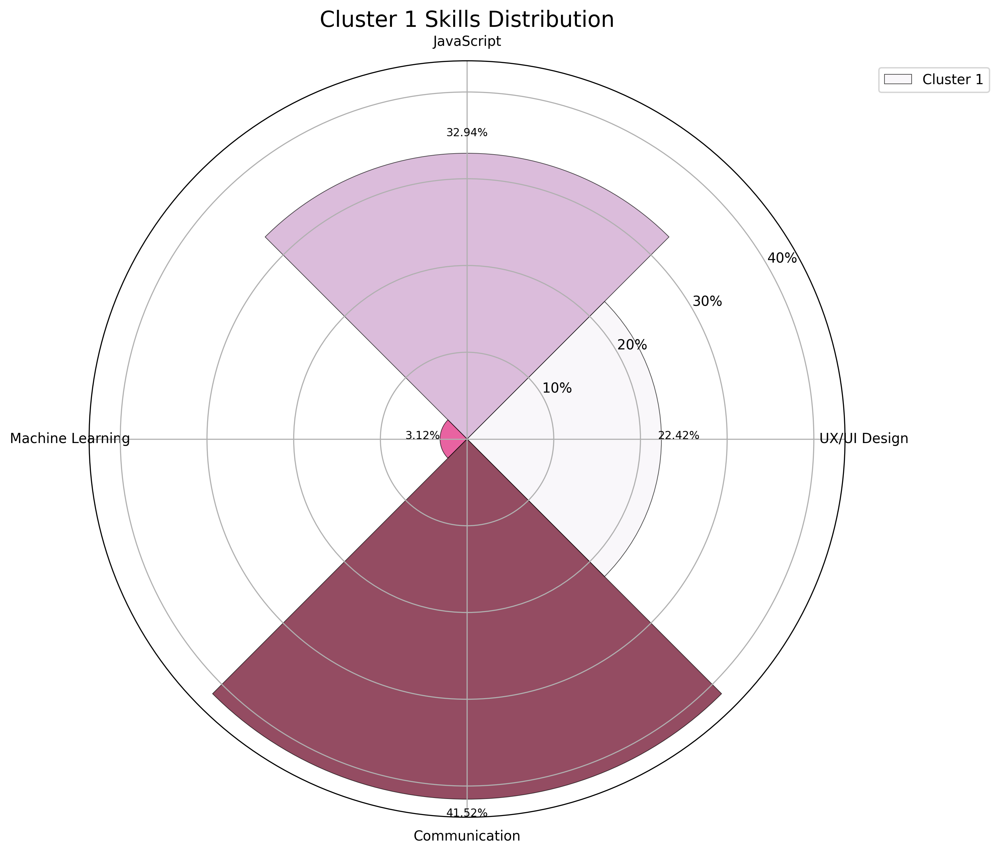

<Figure size 1920x1440 with 0 Axes>

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# 数据准备
skills = [
    "UX/UI Design", "JavaScript", "Machine Learning", "Communication"
]
values = [22.42, 32.94, 3.12, 41.52]

# 计算角度
angles = np.linspace(0, 2 * np.pi, len(skills), endpoint=False)

# 创建玫瑰图
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# 使用不同的颜色映射
colors = plt.cm.PuRd(np.linspace(0, 1, len(skills)))

# 绘制每个技能的扇形
for i in range(len(skills)):
    # 计算每个扇形的起始和结束角度
    start_angle = angles[i]
    end_angle = angles[i] + (2 * np.pi / len(skills))
    
    # 计算每个扇形的半径
    radius = values[i]
    
    # 绘制扇形
    ax.bar([start_angle], [radius], width=(2 * np.pi / len(skills)), bottom=0, 
           color=colors[i], alpha=0.7, edgecolor='black', linewidth=0.5)

# 设置技能标签
ax.set_xticks(angles)
ax.set_xticklabels(skills, fontsize=10, fontfamily='sans-serif')

# 设置径向标签
ax.set_rlabel_position(30)
ax.set_yticks([10, 20, 30, 40])
ax.set_yticklabels(['10%', '20%', '30%', '40%'], fontsize=10)

# 添加注释
for i in range(len(skills)):
    ax.text(angles[i], values[i] + 2, f"{values[i]:.2f}%", ha='center', fontsize=8)

# 添加标题
plt.title('Cluster 1 Skills Distribution', fontsize=16, fontfamily='sans-serif')

# 添加图例
plt.legend(['Cluster 1'], loc='upper right', bbox_to_anchor=(1.2, 1.0))

# 显示图形
plt.show()
plt.savefig('E:/技能需求玫瑰图_cluster1.png') 
